In [334]:
!pip install imbalanced-learn

In [335]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots


import missingno as msno
from scipy.stats import trim_mean, kurtosis, skew

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import KNNImputer
from imblearn.combine import SMOTETomek

from sklearn.model_selection import train_test_split, GridSearchCV

import xgboost as xgb

from sklearn.metrics import classification_report, confusion_matrix, f1_score

from time import perf_counter

import warnings
warnings.filterwarnings('ignore')

In [342]:
data =pd.read_csv('/content/telecom_customer_churn.csv')

In [343]:
data = data.rename(lambda x: x.lower().strip().replace(' ', '_'), axis='columns')

In [344]:
data.head()

,customer_id,gender,age,married,number_of_dependents,city,zip_code,latitude,longitude,number_of_referrals,...,payment_method,monthly_charge,total_charges,total_refunds,total_extra_data_charges,total_long_distance_charges,total_revenue,customer_status,churn_category,churn_reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


In [345]:
data['customer_status'] = data['customer_status'].replace('Joined', 'Stayed')

In [346]:
data.shape

(7043, 38)

In [347]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   customer_id                        7043 non-null   object 
 1   gender                             7043 non-null   object 
 2   age                                7043 non-null   int64  
 3   married                            7043 non-null   object 
 4   number_of_dependents               7043 non-null   int64  
 5   city                               7043 non-null   object 
 6   zip_code                           7043 non-null   int64  
 7   latitude                           7043 non-null   float64
 8   longitude                          7043 non-null   float64
 9   number_of_referrals                7043 non-null   int64  
 10  tenure_in_months                   7043 non-null   int64  
 11  offer                              3166 non-null   objec

In [348]:
data = data.drop(['customer_id', 'city', 'zip_code', 'latitude', 'longitude','number_of_referrals'], axis=1)

In [349]:
data = data.drop(['churn_category', 'churn_reason'], axis=1)

In [350]:
data.duplicated().sum()

np.int64(0)

In [351]:
data.describe(include='O').T

,count,unique,top,freq
gender,7043,2,Male,3555
married,7043,2,No,3641
offer,3166,5,Offer B,824
phone_service,7043,2,Yes,6361
multiple_lines,6361,2,No,3390
internet_service,7043,2,Yes,5517
internet_type,5517,3,Fiber Optic,3035
online_security,5517,2,No,3498
online_backup,5517,2,No,3088
device_protection_plan,5517,2,No,3095


# **EDA**

In [352]:
!pip install ydata-profiling
from ydata_profiling import ProfileReport


In [353]:
profile = ProfileReport(data, title="Telecom Customer Churn Report", explorative=True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 30/30 [00:01<00:00, 29.17it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

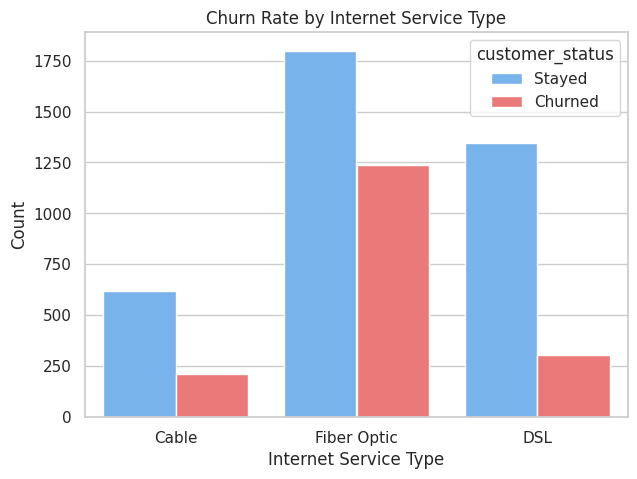

In [354]:
plt.figure(figsize=(7, 5))
sns.countplot(data=data, x="internet_type", hue="customer_status", palette=["#66b3ff", "#ff6666"])
plt.title("Churn Rate by Internet Service Type")
plt.xlabel("Internet Service Type")
plt.ylabel("Count")
plt.show()

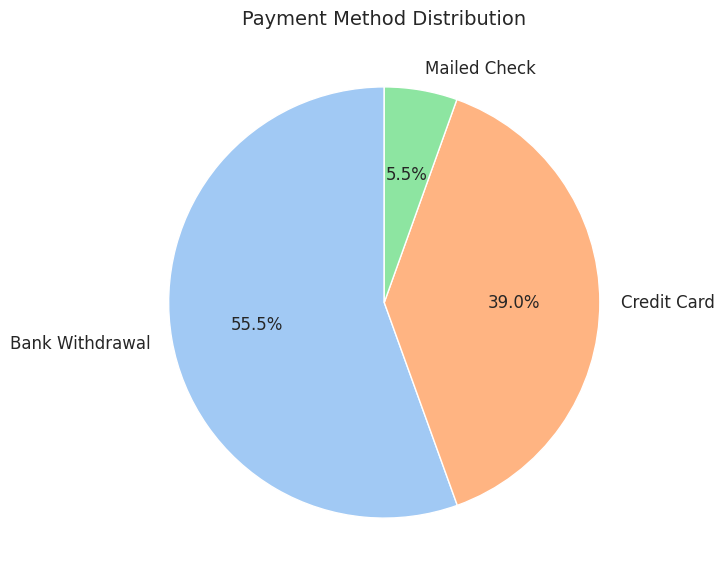

In [355]:
payment_counts = data["payment_method"].value_counts()
plt.figure(figsize=(7, 7))
colors = sns.color_palette("pastel")
plt.pie(payment_counts, labels=payment_counts.index, autopct='%1.1f%%', colors=colors, startangle=90, textprops={"fontsize":12})
plt.title("Payment Method Distribution", fontsize=14)
plt.show()

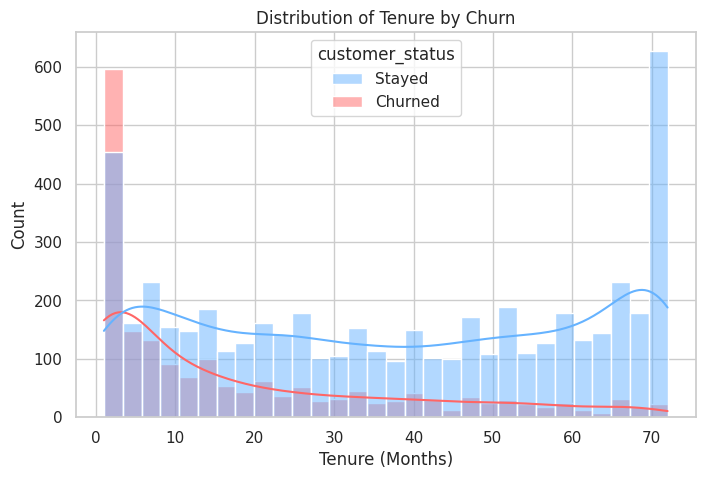

In [356]:
#Churn vs Tenure
plt.figure(figsize=(8, 5))
sns.histplot(data=data, x="tenure_in_months", hue="customer_status", bins=30, kde=True, palette=["#66b3ff", "#ff6666"])
plt.title("Distribution of Tenure by Churn")
plt.xlabel("Tenure (Months)")
plt.ylabel("Count")
plt.show()

In [357]:
churn_counts = pd.crosstab(data["gender"], data["customer_status"])
print(churn_counts)


customer_status  Churned  Stayed
gender                          
Female               939    2549
Male                 930    2625


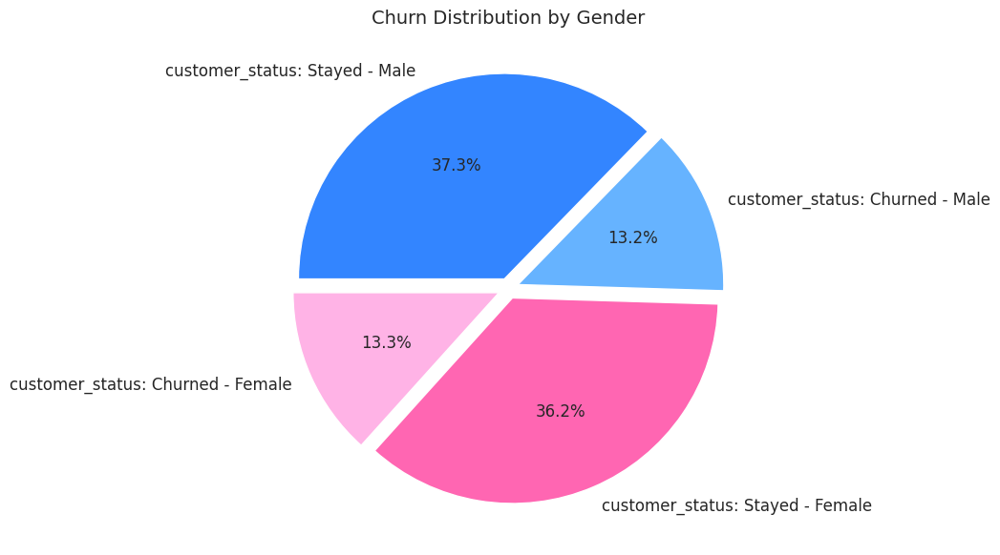

In [358]:
sizes =churn_counts.values.flatten() #بيخلي الجدول array
labels = [f"customer_status: {col} - {index}" for index in churn_counts.index for col in churn_counts.columns]#3loops belfo 3la el churn w el gender w yes.no
colors = ["#ffb3e6", "#ff66b2", "#66b3ff", "#3385ff"]
explode = [0.05] * len(sizes)

plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors,
        startangle=180, explode=explode, textprops={"fontsize":12})
plt.title("Churn Distribution by Gender", fontsize=14)
plt.show()

In [359]:
rows, cols = 5, 4
plots_per_figure = rows * cols
categorical_cols = [col for col in data.select_dtypes(include=['object']).columns]
num_plots = len(categorical_cols)

# Create figure with subplots
fig = make_subplots(
    rows=rows,
    cols=cols,
    subplot_titles=[f"Distribution of {col}" for col in categorical_cols[:plots_per_figure]],
    vertical_spacing=0.1,
    horizontal_spacing=0.05
)

# Plot each categorical column
for i, col in enumerate(categorical_cols[:plots_per_figure]):
    row = (i // cols) + 1
    col_idx = (i % cols) + 1

    # Get value counts
    counts = data[col].value_counts().reset_index()
    counts.columns = [col, 'count']

    # Add bar trace
    fig.add_trace(
        go.Bar(
            x=counts[col],
            y=counts['count'],
            text=counts['count'],
            textposition='auto',
            textfont=dict(size=10),
            marker_color=px.colors.sequential.Viridis
        ),
        row=row,
        col=col_idx
    )

    # Update x-axis for rotation
    fig.update_xaxes(
        tickangle=20,
        tickfont=dict(size=9),
        row=row,
        col=col_idx
    )

    # Update y-axis
    fig.update_yaxes(
        title_text="Count",
        titlefont=dict(size=10),
        tickfont=dict(size=9),
        row=row,
        col=col_idx
    )

# Update layout
fig.update_layout(
    height=1200,
    width=1200,
    showlegend=False,
    title_text="Categorical Distributions",
    title_x=0.5,
    title_font=dict(size=14),
    margin=dict(l=50, r=50, t=80, b=50)
)

# Show figure
fig.show()

In [360]:
rows, cols = 3, 3
plots_per_figure = rows * cols
categorical_cols = [col for col in data.select_dtypes(include=['object']).columns if col != 'customer_status']
num_plots = len(categorical_cols)
num_figures = (num_plots + plots_per_figure - 1) // plots_per_figure  # Ceiling division

# Unique customer_status values for legend
statuses = data['customer_status'].unique()
colors = px.colors.qualitative.Set2[:len(statuses)]  # Match colors to unique statuses

# Create a figure for each set of 6 plots
for fig_idx in range(num_figures):
    start_idx = fig_idx * plots_per_figure
    end_idx = min(start_idx + plots_per_figure, num_plots)
    current_cols = categorical_cols[start_idx:end_idx]

    # Create subplot grid for this figure
    fig = make_subplots(
        rows=rows,
        cols=cols,
        subplot_titles=[f"Distribution of {col}" for col in current_cols],
        vertical_spacing=0.15,
        horizontal_spacing=0.1
    )

    # Plot each categorical column
    for i, col in enumerate(current_cols):
        row = (i // cols) + 1
        col_idx = (i % cols) + 1

        # Group by column and customer_status to get counts
        counts = data.groupby([col, 'customer_status']).size().reset_index(name='count')

        # Add bars for each customer_status value
        for j, status in enumerate(statuses):
            status_data = counts[counts['customer_status'] == status]
            fig.add_trace(
                go.Bar(
                    x=status_data[col],
                    y=status_data['count'],
                    name=status,
                    text=status_data['count'],
                    textposition='auto',
                    textfont=dict(size=10),
                    marker_color=colors[j],
                    showlegend=(i == 0)  # Show legend only for the first subplot
                ),
                row=row,
                col=col_idx
            )

        # Update x-axis for rotation
        fig.update_xaxes(
            tickangle=45,
            tickfont=dict(size=9),
            row=row,
            col=col_idx
        )

        # Update y-axis for consistency
        fig.update_yaxes(
            title_text="Count",
            titlefont=dict(size=10),
            tickfont=dict(size=9),
            row=row,
            col=col_idx
        )

    # Update layout
    fig.update_layout(
        height=800,
        width=1100,
        showlegend=True,
        barmode='stack',
        title_text=f"Categorical Distributions by Customer Status",
        title_x=0.5,
        title_font=dict(size=14),
        legend=dict(
            x=1.05,
            y=0.5,
            font=dict(size=10)
        ),
        margin=dict(l=50, r=150, t=80, b=50)
    )

    # Show the figure
    fig.show()

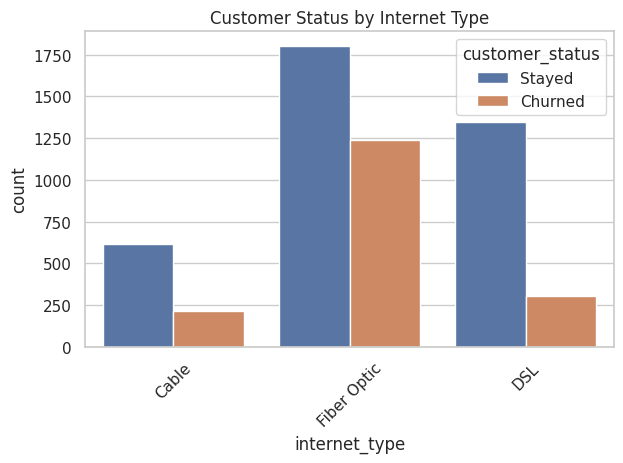

In [361]:
plt.figure()
sns.countplot(data=data, x="internet_type", hue="customer_status")
plt.title("Customer Status by Internet Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


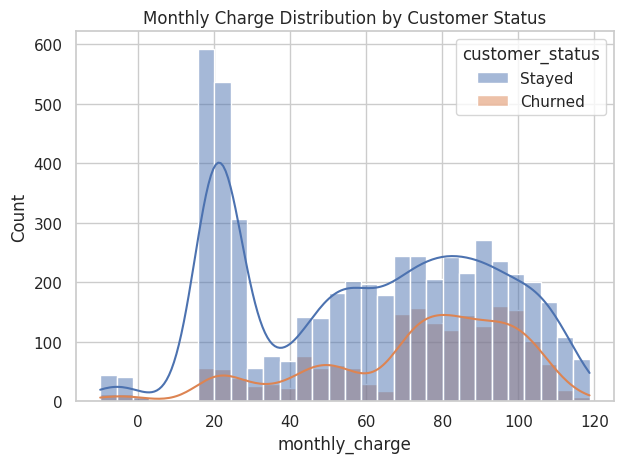

In [362]:
plt.figure()
sns.histplot(data=data, x="monthly_charge", hue="customer_status", kde=True, bins=30)
plt.title("Monthly Charge Distribution by Customer Status")
plt.tight_layout()
plt.show()


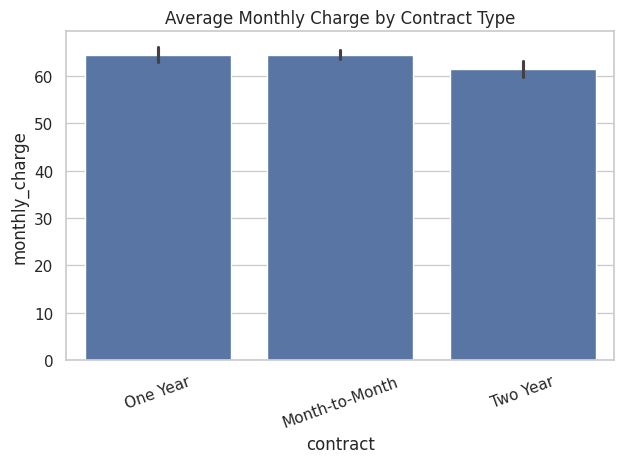

In [363]:
plt.figure()
sns.barplot(data=data, x="contract", y="monthly_charge", estimator='mean')
plt.title("Average Monthly Charge by Contract Type")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()


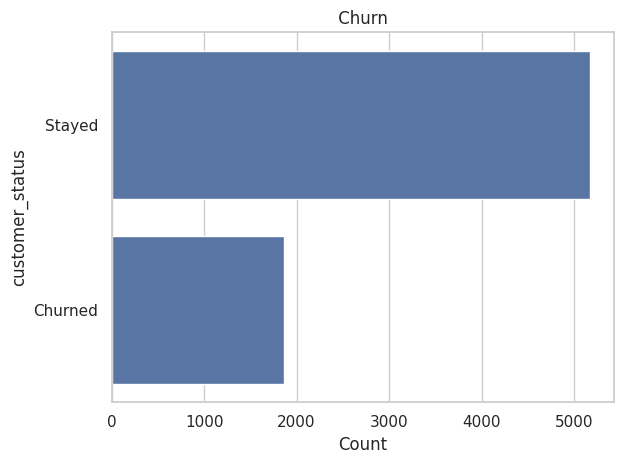

In [364]:
plt.figure()
reason_counts = data["customer_status"].value_counts().head(10)
sns.barplot(y=reason_counts.index, x=reason_counts.values)
plt.title(" Churn ")
plt.xlabel("Count")
plt.tight_layout()
plt.show()


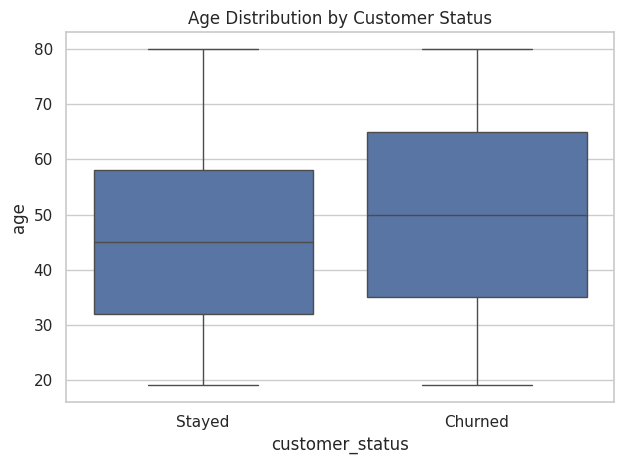

In [365]:
plt.figure()
sns.boxplot(data=data, x="customer_status", y="age")
plt.title("Age Distribution by Customer Status")
plt.tight_layout()
plt.show()


In [366]:
data.describe(include='number').T

,count,mean,std,min,25%,50%,75%,max
age,7043.0,46.509726,16.750352,19.00,32.000,46.00,60.000,80.00
number_of_dependents,7043.0,0.468692,0.962802,0.00,0.000,0.00,0.000,9.00
tenure_in_months,7043.0,32.386767,24.542061,1.00,9.000,29.00,55.000,72.00
avg_monthly_long_distance_charges,6361.0,25.420517,14.200374,1.01,13.050,25.69,37.680,49.99
avg_monthly_gb_download,5517.0,26.189958,19.586585,2.00,13.000,21.00,30.000,85.00
monthly_charge,7043.0,63.596131,31.204743,-10.00,30.400,70.05,89.750,118.75
total_charges,7043.0,2280.381264,2266.220462,18.80,400.150,1394.55,3786.600,8684.80
total_refunds,7043.0,1.962182,7.902614,0.00,0.000,0.00,0.000,49.79
total_extra_data_charges,7043.0,6.860713,25.104978,0.00,0.000,0.00,0.000,150.00
total_long_distance_charges,7043.0,749.099262,846.660055,0.00,70.545,401.44,1191.100,3564.72


In [367]:
rows, cols = 3, 4
numeric_cols = data.select_dtypes(include=['number']).columns

# Create figure with subplots
fig = make_subplots(
    rows=rows,
    cols=cols,
    subplot_titles=[f"Distribution of {col}" for col in numeric_cols],
    vertical_spacing=0.15,
    horizontal_spacing=0.05
)

# Plot each numeric column
for i, col in enumerate(numeric_cols):
    row = (i // cols) + 1
    col_idx = (i % cols) + 1

    # Create histogram
    fig.add_trace(
        go.Histogram(
            x=data[col],
            nbinsx=30,
            histnorm='probability density',
            name=col,
            marker_color='skyblue'
        ),
        row=row,
        col=col_idx
    )

    # Add kernel density estimation
    if not data[col].isna().all():
        from scipy import stats
        kernel = stats.gaussian_kde(data[col].dropna())
        x_range = np.linspace(data[col].min(), data[col].max(), 100)
        fig.add_trace(
            go.Scatter(
                x=x_range,
                y=kernel(x_range),
                mode='lines',
                name='KDE',
                line=dict(color='red')
            ),
            row=row,
            col=col_idx
        )

    # Update axes
    fig.update_xaxes(
        title_text=col,
        titlefont=dict(size=10),
        tickfont=dict(size=9),
        row=row,
        col=col_idx
    )
    fig.update_yaxes(
        title_text="Density",
        titlefont=dict(size=10),
        tickfont=dict(size=9),
        row=row,
        col=col_idx
    )

# Update layout
fig.update_layout(
    height=900,
    width=1700,
    showlegend=False,
    title_text="Numeric Distributions",
    title_x=0.5,
    title_font=dict(size=14),
    margin=dict(l=50, r=50, t=100, b=50)
)

# Show figure
fig.show()

In [368]:
# Define columns for groupby
groupby_columns = ['age', 'monthly_charge', 'total_charges', 'total_revenue', 'total_refunds']

# using groupby
groupby_result = data.groupby('customer_status')[groupby_columns].agg(lambda x: trim_mean(x, 0.05))

# Display the result
print("Groupby:")
groupby_result

Groupby:


,age,monthly_charge,total_charges,total_revenue,total_refunds
customer_status,,,,,
Churned,49.749257,74.780303,1322.459982,1699.445383,0.048604
Stayed,44.990983,59.929347,2401.464146,3240.518298,0.395058


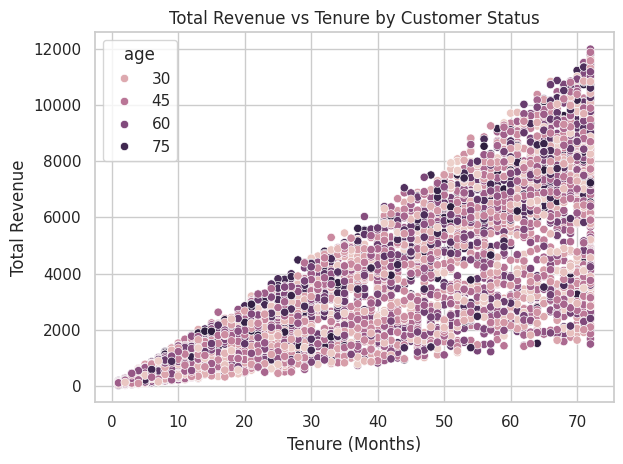

In [369]:
plt.figure()
sns.scatterplot(data, x="tenure_in_months", y="total_revenue", hue="age")
plt.title("Total Revenue vs Tenure by Customer Status")
plt.xlabel("Tenure (Months)")
plt.ylabel("Total Revenue")
plt.tight_layout()
plt.show()


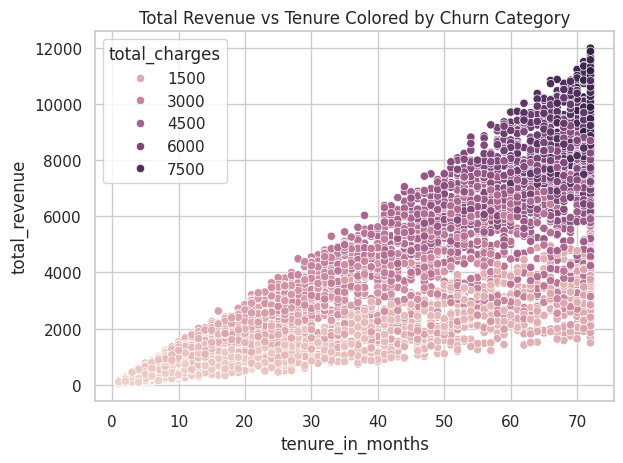

In [370]:
plt.figure()
sns.scatterplot(data, x="tenure_in_months", y="total_revenue", hue="total_charges")
plt.title("Total Revenue vs Tenure Colored by Churn Category")
plt.tight_layout()
plt.show()


The Highest Correlation among Features:


,0
age,avg_monthly_gb_download
number_of_dependents,avg_monthly_gb_download
tenure_in_months,total_revenue
avg_monthly_long_distance_charges,total_long_distance_charges
avg_monthly_gb_download,age
monthly_charge,total_charges
total_charges,total_revenue
total_refunds,tenure_in_months
total_extra_data_charges,total_revenue
total_long_distance_charges,total_revenue


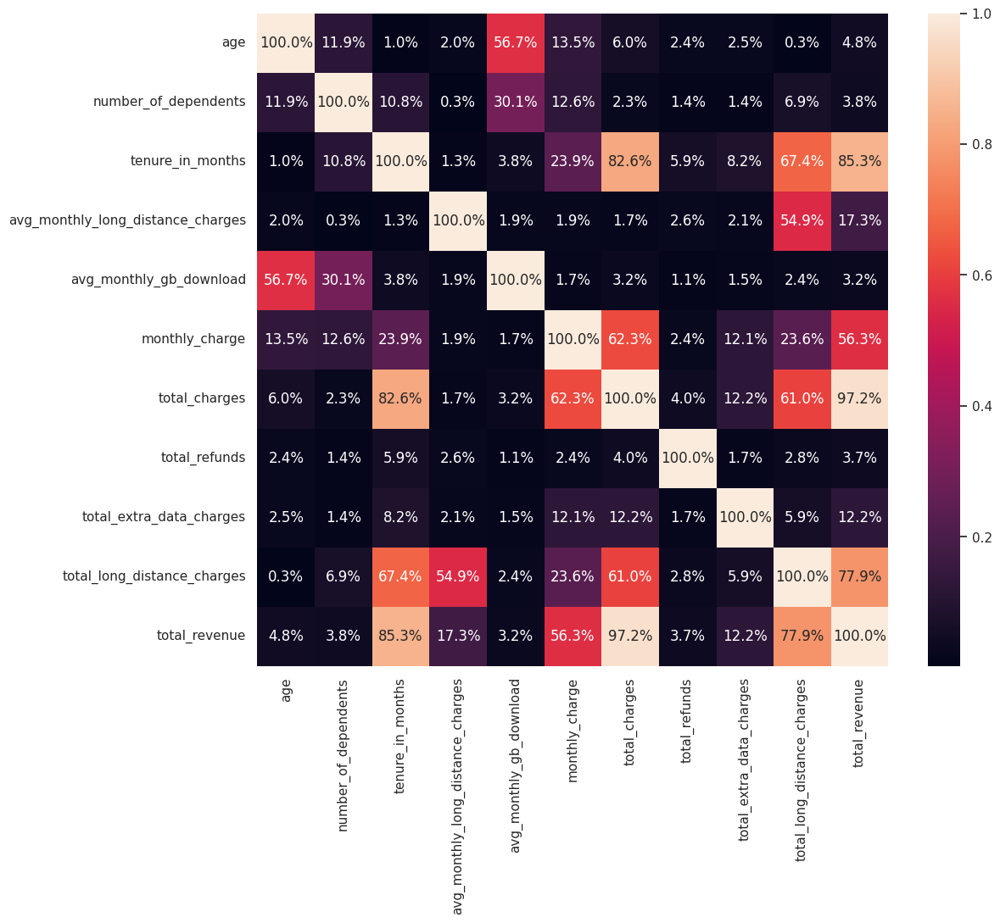

In [371]:
# heat map
corr_mat = data.select_dtypes(include=['number']).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_mat.abs(), annot=True, fmt=".1%")

print('The Highest Correlation among Features:')
for x in range(len(data.select_dtypes(include=['number']).columns)):
  corr_mat.iloc[x,x] = 0.0
corr_mat.abs().idxmax()

In [372]:
data = data.drop(['total_charges'],axis=1)

# **Preprocessing**

In [373]:
numeric_data = data.select_dtypes(include=['number'])

# Calculate skewness of numerical features
skewness = numeric_data.apply(skew)

print("Skewness of numerical features:")
print(skewness)

Skewness of numerical features:
age                                  0.162152
number_of_dependents                 2.109483
tenure_in_months                     0.240491
avg_monthly_long_distance_charges         NaN
avg_monthly_gb_download                   NaN
monthly_charge                      -0.275335
total_refunds                        4.327595
total_extra_data_charges             4.090338
total_long_distance_charges          1.238018
total_revenue                        0.919214
dtype: float64


In [374]:
# Define the columns to transform
columns_to_transform = ['number_of_dependents','total_refunds',
                        'total_extra_data_charges', 'total_long_distance_charges']

# Create new columns for sqrt and log transformations
for column in columns_to_transform:
    data[f'{column}_sqrt'] = np.sqrt(data[column])
    data[f'{column}_log'] = np.log1p(data[column])

# Calculate skewness before and after transformations
skewness_before = data[columns_to_transform].apply(skew)
skewness_after_sqrt = data[[f'{column}_sqrt' for column in columns_to_transform]].apply(skew)
skewness_after_log = data[[f'{column}_log' for column in columns_to_transform]].apply(skew)

# Print skewness before and after transformations
print("Skewness before transformation:")
print(skewness_before)
print("\nSkewness after square root transformation:")
print(skewness_after_sqrt)
print("\nSkewness after log transformation:")
print(skewness_after_log)

Skewness before transformation:
number_of_dependents           2.109483
total_refunds                  4.327595
total_extra_data_charges       4.090338
total_long_distance_charges    1.238018
dtype: float64

Skewness after square root transformation:
number_of_dependents_sqrt           1.504378
total_refunds_sqrt                  3.693488
total_extra_data_charges_sqrt       3.271733
total_long_distance_charges_sqrt    0.384645
dtype: float64

Skewness after log transformation:
number_of_dependents_log           1.591194
total_refunds_log                  3.485350
total_extra_data_charges_log       2.853981
total_long_distance_charges_log   -1.108219
dtype: float64


In [375]:
# drop redundunt columns
data = data.drop(['number_of_dependents', 'number_of_dependents_log',
                  'total_refunds', 'total_refunds_sqrt',
                  'total_extra_data_charges', 'total_extra_data_charges_sqrt',
                  'total_long_distance_charges', 'total_long_distance_charges_log'], axis=1)

null values in nominal features:
gender                       0
married                      0
offer                     3877
phone_service                0
multiple_lines             682
internet_service             0
internet_type             1526
online_security           1526
online_backup             1526
device_protection_plan    1526
premium_tech_support      1526
streaming_tv              1526
streaming_movies          1526
streaming_music           1526
unlimited_data            1526
contract                     0
paperless_billing            0
payment_method               0
customer_status              0
dtype: int64


<Axes: >

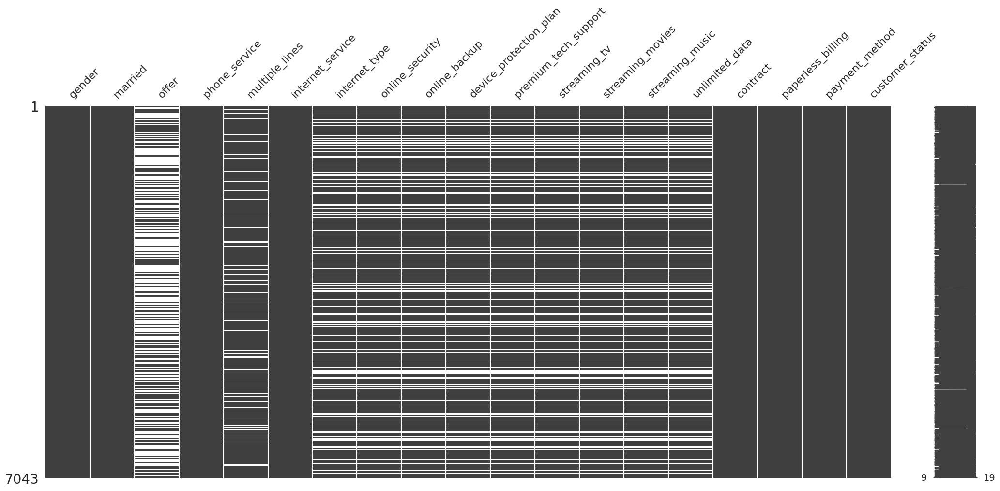

In [376]:
# checking null values
print(f"null values in nominal features:\n{data.select_dtypes(include=['object']).isna().sum()}")
msno.matrix(data.select_dtypes(include=['object']))

In [377]:
# filling null values
data['internet_type'] = data['internet_type'].apply(lambda x: 'no_internet_service' if pd.isnull(x) else x)
data['offer'] = data['offer'].apply(lambda x: 'no_offer' if pd.isnull(x) else x)

column_name = ['online_security', 'online_backup', 'device_protection_plan', 'premium_tech_support',
               'streaming_tv', 'streaming_movies', 'streaming_music', 'unlimited_data']
for column in column_name:
  data[column] = data[column].apply(lambda x: 'no_internet_service' if pd.isnull(x) else x)

<Axes: >

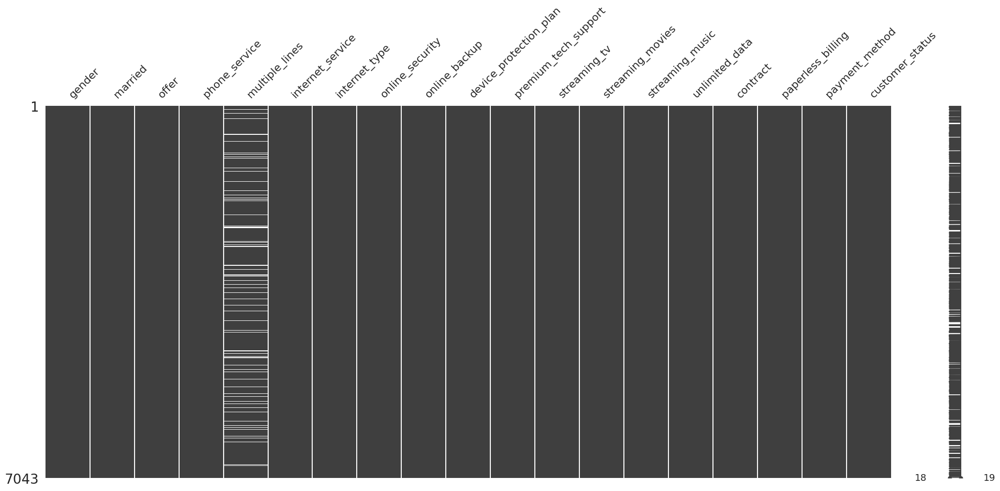

In [378]:
msno.matrix(data.select_dtypes(include=['object']))

In [379]:
print("null values in numerical features:\n",data.select_dtypes(include=['number']).isna().sum())

null values in numerical features:
 age                                     0
tenure_in_months                        0
avg_monthly_long_distance_charges     682
avg_monthly_gb_download              1526
monthly_charge                          0
total_revenue                           0
number_of_dependents_sqrt               0
total_refunds_log                       0
total_extra_data_charges_log            0
total_long_distance_charges_sqrt        0
dtype: int64


In [380]:
# filling null values
column_name = ['avg_monthly_long_distance_charges', 'avg_monthly_gb_download']
for column in column_name:
  data[column] = data[column].apply(lambda x: 0 if pd.isnull(x) else x)

null values in numerical features:
 age                                  0
tenure_in_months                     0
avg_monthly_long_distance_charges    0
avg_monthly_gb_download              0
monthly_charge                       0
total_revenue                        0
number_of_dependents_sqrt            0
total_refunds_log                    0
total_extra_data_charges_log         0
total_long_distance_charges_sqrt     0
dtype: int64


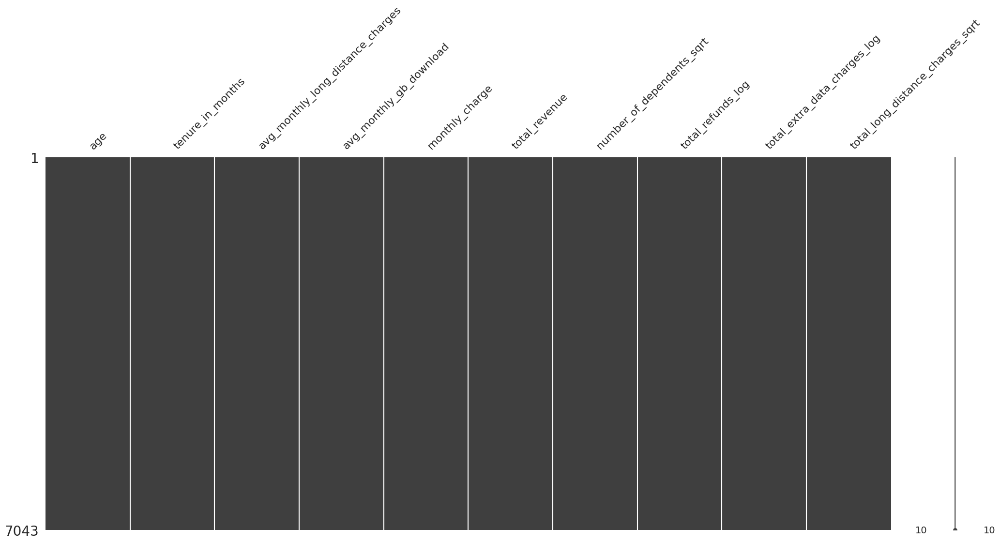

In [381]:
# checking null values
msno.matrix(data.select_dtypes(include=['number']))
print("null values in numerical features:\n",data.select_dtypes(include=['number']).isna().sum())

# **Lable Encoding**

In [382]:
# first step:
conversion_dict = {"Yes": 1, "No": 0}
data['multiple_lines'] = data['multiple_lines'].map(conversion_dict)

# second step: labeling the target by using LabelEncoder
label_encoder = LabelEncoder()
data['customer_status'] = label_encoder.fit_transform(data['customer_status'])

# third step: using pd.get_dummies for other features
data = pd.get_dummies(data, drop_first=True)

In [383]:
# Extract the label column before imputation
label_column = data['customer_status']
data = data.drop(columns=['customer_status'])

# the KNNImputer
imputer = KNNImputer(n_neighbors=3)
imputed_data = imputer.fit_transform(data)

# If we want to keep the DataFrame format:
data = pd.DataFrame(data=imputed_data, columns=data.columns)


# Round the imputed values for 'multiple_lines' to get the mode
data['multiple_lines'] = data['multiple_lines'].apply(lambda x: round(x))

# Reattach the label column
data['customer_status'] = label_column

<Axes: >

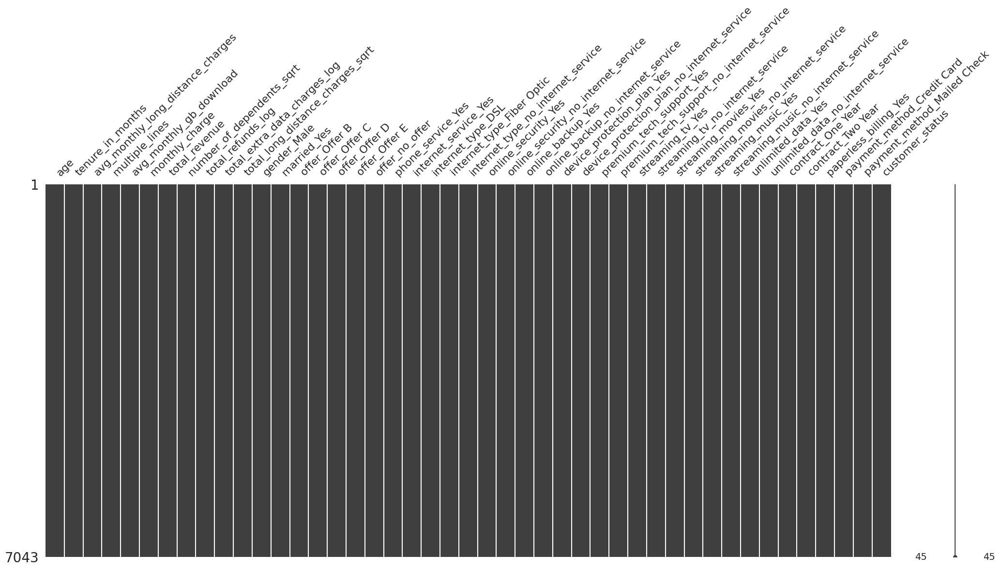

In [384]:
# checking missing value
msno.matrix(data)

# **Split & Train**

In [385]:
X = data.drop(['customer_status'], axis=1)
y = data.loc[:, 'customer_status'].values

In [386]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True, stratify=data.customer_status)

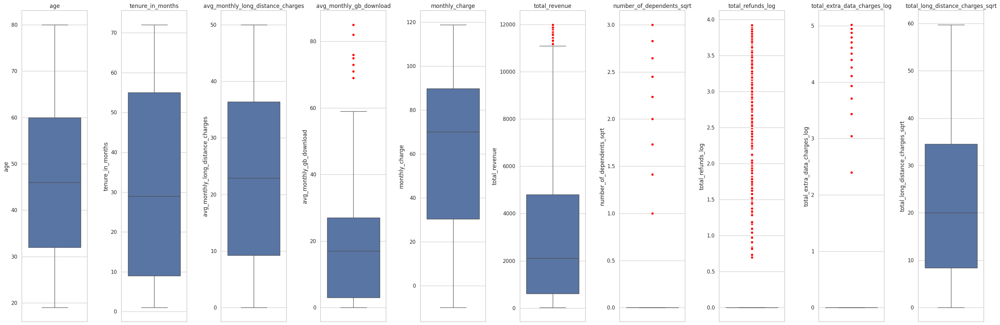

In [387]:
red_circle = dict(markerfacecolor='red', marker='o', markeredgecolor='white')

numerical_columns = ['age', 'tenure_in_months', 'avg_monthly_long_distance_charges', 'avg_monthly_gb_download', 'monthly_charge',
                  'total_revenue', 'number_of_dependents_sqrt', 'total_refunds_log',
                  'total_extra_data_charges_log', 'total_long_distance_charges_sqrt']

# Create boxplots for numerical columns
num_plots = len(numerical_columns)

fig, axes = plt.subplots(nrows=1, ncols=num_plots, figsize=(30, 10))

for index, col in enumerate(numerical_columns):
    sns.boxplot(y=data[col], ax=axes[index], flierprops=red_circle)
    axes[index].set_ylabel(col)
    axes[index].set_title(col)

plt.tight_layout()
plt.show()


In [388]:
# outlier data
def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

In [389]:
outlier_detection = data[numerical_columns]
for k, v in outlier_detection.items():
        outliers = find_outliers_IQR(v)
        perc = len(find_outliers_IQR(v)) * 100.0 / np.shape(outlier_detection)[0]
        print(f'Column :{k}')
        print(f"Number of Outliers = {len(outliers)}","||",f"Max Outlier Value = {outliers.max()}",
              "||", f"Min Outlier Value = {outliers.min()}", "||", f"Percentage of Outliers = {perc:.2f}%")
        print("\n")

Column :age
Number of Outliers = 0 || Max Outlier Value = nan || Min Outlier Value = nan || Percentage of Outliers = 0.00%


Column :tenure_in_months
Number of Outliers = 0 || Max Outlier Value = nan || Min Outlier Value = nan || Percentage of Outliers = 0.00%


Column :avg_monthly_long_distance_charges
Number of Outliers = 0 || Max Outlier Value = nan || Min Outlier Value = nan || Percentage of Outliers = 0.00%


Column :avg_monthly_gb_download
Number of Outliers = 362 || Max Outlier Value = 85.0 || Min Outlier Value = 69.0 || Percentage of Outliers = 5.14%


Column :monthly_charge
Number of Outliers = 0 || Max Outlier Value = nan || Min Outlier Value = nan || Percentage of Outliers = 0.00%


Column :total_revenue
Number of Outliers = 21 || Max Outlier Value = 11979.34 || Min Outlier Value = 11169.77 || Percentage of Outliers = 0.30%


Column :number_of_dependents_sqrt
Number of Outliers = 1627 || Max Outlier Value = 3.0 || Min Outlier Value = 1.0 || Percentage of Outliers = 23.10%




In [390]:
def handle_outliers(X_train, X_test, columns):
    for col in columns:
        Q1 = np.percentile(X_train[col], 25)
        Q3 = np.percentile(X_train[col], 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Handling outliers in X_train
        X_train[col] = np.where(X_train[col] < lower_bound, lower_bound, X_train[col])
        X_train[col] = np.where(X_train[col] > upper_bound, upper_bound, X_train[col])

        # Handling outliers in X_test based on X_train IQR
        X_test[col] = np.where(X_test[col] < lower_bound, lower_bound, X_test[col])
        X_test[col] = np.where(X_test[col] > upper_bound, upper_bound, X_test[col])

    return X_train, X_test


# Define the columns to apply outlier handling
columns_to_handle = ['avg_monthly_gb_download', 'total_revenue', 'number_of_dependents_sqrt',
                     'total_refunds_log', 'total_extra_data_charges_log']

# Apply the function to the specified columns
X_train, X_test = handle_outliers(X_train, X_test, columns_to_handle)

# **Scaling**

In [391]:
scaler = StandardScaler()

X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])
X_test[numerical_columns] = scaler.transform(X_test[numerical_columns])

In [392]:
data.head()

,age,tenure_in_months,avg_monthly_long_distance_charges,multiple_lines,avg_monthly_gb_download,monthly_charge,total_revenue,number_of_dependents_sqrt,total_refunds_log,total_extra_data_charges_log,...,streaming_music_Yes,streaming_music_no_internet_service,unlimited_data_Yes,unlimited_data_no_internet_service,contract_One Year,contract_Two Year,paperless_billing_Yes,payment_method_Credit Card,payment_method_Mailed Check,customer_status
0,37.0,9.0,42.39,0,16.0,65.6,974.81,0.0,0.000000,0.000000,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1
1,46.0,9.0,10.69,1,10.0,-4.0,610.28,0.0,3.671988,2.397895,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
2,50.0,4.0,33.65,0,30.0,73.9,415.45,0.0,0.000000,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0
3,78.0,13.0,27.82,0,4.0,98.0,1599.51,0.0,0.000000,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0
4,75.0,3.0,7.38,0,11.0,83.9,289.54,0.0,0.000000,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0


In [393]:
# Count the values of y_train
y_train_counts = pd.Series(y_train).value_counts()

print("Counts of each class in y_train:")
print(y_train_counts)

Counts of each class in y_train:
1    4139
0    1495
Name: count, dtype: int64


In [394]:
from imblearn.under_sampling import RandomUnderSampler
import pandas as pd

rus = RandomUnderSampler(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)

print('Resampled training set shape:\n', pd.Series(y_train_resampled).value_counts())

Resampled training set shape:
 0    1495
1    1495
Name: count, dtype: int64


In [395]:
import xgboost as xgb
from sklearn.metrics import classification_report, accuracy_score, f1_score
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import joblib

best_params_adjusted = {
    'colsample_bytree': 0.8,
    'learning_rate': 0.1,
    'max_depth': 3,
    'min_child_weight': 5,
    'n_estimators': 200,
    'reg_alpha': 0.05,
    'reg_lambda': 1.5,
    'subsample': 0.8,
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'early_stopping_rounds': 10
}
print(f"Using adjusted best parameters for XGBClassifier constructor: {best_params_adjusted}")



try:
    if isinstance(y_train_resampled, pd.Series):
        y_train_resampled_np = y_train_resampled.to_numpy()
    else:
        y_train_resampled_np = np.array(y_train_resampled)

    count_negative_class = np.sum(y_train_resampled_np == 0)
    count_positive_class = np.sum(y_train_resampled_np == 1)

    if count_positive_class == 0:
        print("Warning: Positive class (1) count is zero. Defaulting scale_pos_weight to 1.")
        scale_pos_weight = 1
    elif count_negative_class == 0:
        print("Warning: Negative class (0) count is zero. Defaulting scale_pos_weight to 1.")
        scale_pos_weight = 1
    else:
        scale_pos_weight = count_negative_class / count_positive_class

    print(f"Calculated scale_pos_weight: {scale_pos_weight:.4f}")
    print(f"Counts in y_train_resampled: Negative (0)={count_negative_class}, Positive (1)={count_positive_class}")
    if abs(scale_pos_weight - 1.0) < 0.05:
        print("y_train_resampled is nearly balanced. scale_pos_weight is close to 1.0.")

except Exception as e:
    print(f"Error calculating scale_pos_weight: {e}. Defaulting scale_pos_weight to 1.")
    scale_pos_weight = 1


if X_train_resampled.shape[0] > 0 and y_train_resampled_np.shape[0] > 0:
    X_train_final, X_eval, y_train_final, y_eval = train_test_split(
        X_train_resampled, y_train_resampled_np, test_size=0.1, random_state=42, stratify=y_train_resampled_np
    )
    eval_set_for_fit = [(X_eval, y_eval)]
    print(f"\nCreated evaluation set: X_train_final shape: {X_train_final.shape}, X_eval shape: {X_eval.shape}")
else:
    print("\nWarning: X_train_resampled or y_train_resampled_np is empty. Cannot create evaluation set for early stopping.")
    X_train_final, y_train_final = X_train_resampled, y_train_resampled_np
    eval_set_for_fit = None

final_model_es = xgb.XGBClassifier(
    **best_params_adjusted,
    scale_pos_weight=scale_pos_weight,
    use_label_encoder=False
)

print("\nTraining final model (early stopping configured at initialization)...")

if eval_set_for_fit:
    final_model_es.fit(
        X_train_final,
        y_train_final,
        eval_set=eval_set_for_fit,
        verbose=False
    )

    print(f"Model training complete. Effective number of trees: {len(final_model_es.get_booster().get_dump()) if final_model_es.get_booster() else 'N/A'}")
    if hasattr(final_model_es, 'best_iteration_'):
         print(f"Best iteration recorded: {final_model_es.best_iteration_}")


else:
    final_model_es.fit(X_train_final, y_train_final)
    print("Model training complete (no early stopping as eval_set was not created).")


y_train_pred_es = final_model_es.predict(X_train_resampled)
y_test_pred_es = final_model_es.predict(X_test)

if isinstance(y_test, pd.Series):
    y_test_np = y_test.to_numpy()
else:
    y_test_np = np.array(y_test)

train_accuracy_es = accuracy_score(y_train_resampled_np, y_train_pred_es)
test_accuracy_es = accuracy_score(y_test_np, y_test_pred_es)
train_f1_es = f1_score(y_train_resampled_np, y_train_pred_es, average='macro')
test_f1_es = f1_score(y_test_np, y_test_pred_es, average='macro')

print("\n--- Final Model with Early Stopping: Performance ---")
print(f"Parameters used at initialization: {final_model_es.get_params()}")
print(f"Training Accuracy: {train_accuracy_es:.4f}")
print(f"Training F1 Score (macro): {train_f1_es:.4f}")
print(f"Test Accuracy: {test_accuracy_es:.4f}")
print(f"Test F1 Score (macro): {test_f1_es:.4f}")

print("\nClassification Report (Test Set - Final Model with Early Stopping):")
print(classification_report(y_test_np, y_test_pred_es))

if train_f1_es > test_f1_es + 0.05:
    print("\nWarning: Potential overfitting still detected (Train F1 > Test F1 + 0.05). Consider further tuning or different strategies.")
elif train_f1_es < test_f1_es - 0.02 :
    print("\nNote: Training F1 is lower than Test F1, which might indicate the model is too simple or early stopping was too aggressive.")
else:
    print("\nOverfitting seems to be reduced or managed.")

if isinstance(X_train_resampled, pd.DataFrame):
    feature_importance_es = pd.DataFrame({
        'feature': X_train_resampled.columns,
        'importance': final_model_es.feature_importances_
    }).sort_values(by='importance', ascending=False)
    print("\nFeature Importance (Final Model with Early Stopping):\n", feature_importance_es.to_string())
else:
    print("\nFeature importance cannot be displayed as X_train_resampled is not a pandas DataFrame.")
    print(f"Feature importances raw: {final_model_es.feature_importances_}")

best_model = final_model_es



Using adjusted best parameters for XGBClassifier constructor: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 200, 'reg_alpha': 0.05, 'reg_lambda': 1.5, 'subsample': 0.8, 'objective': 'binary:logistic', 'eval_metric': 'logloss', 'early_stopping_rounds': 10}
Calculated scale_pos_weight: 1.0000
Counts in y_train_resampled: Negative (0)=1495, Positive (1)=1495
y_train_resampled is nearly balanced. scale_pos_weight is close to 1.0.

Created evaluation set: X_train_final shape: (2691, 44), X_eval shape: (299, 44)

Training final model (early stopping configured at initialization)...
Model training complete. Effective number of trees: 77

--- Final Model with Early Stopping: Performance ---
Parameters used at initialization: {'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.8, 'device': None, 'early_stopping_rounds': 10, 'ena

In [396]:
# import pandas as pd
# import numpy as np
# import joblib
# import json
# from sklearn.preprocessing import LabelEncoder, StandardScaler
# from sklearn.impute import KNNImputer
# import xgboost as xgb
# from sklearn.model_selection import train_test_split # For recreating X_train for scaler etc.


# print("Starting artifact saving process (v2 - 'number_of_referrals' dropped)...")

# original_data = pd.read_csv('telecom_customer_churn.csv')
# data_for_preprocessing = original_data.rename(lambda x: x.lower().strip().replace(' ', '_'), axis='columns')
# data_for_preprocessing['customer_status'] = data_for_preprocessing['customer_status'].replace('Joined', 'Stayed')

# cols_to_drop_initial = [
#     'customer_id', 'city', 'zip_code', 'latitude', 'longitude',
#     'churn_category', 'churn_reason', 'total_charges'
# ]
# data_for_preprocessing = data_for_preprocessing.drop(
#     columns=[col for col in cols_to_drop_initial if col in data_for_preprocessing.columns],
#     errors='ignore'
# )

# if 'number_of_referrals' in data_for_preprocessing.columns:
#     data_for_preprocessing = data_for_preprocessing.drop(columns=['number_of_referrals'])
#     print("Dropped 'number_of_referrals' from initial data_for_preprocessing.")
# else:
#     print("'number_of_referrals' not found in initial data_for_preprocessing (already dropped or never existed).")

# columns_to_transform_skew = [
#     'number_of_dependents',
#     'total_refunds',
#     'total_extra_data_charges',
#     'total_long_distance_charges'
# ]


# skew_transform_map = {
#     'number_of_dependents': 'sqrt',

#     'total_refunds': 'log',
#     'total_extra_data_charges': 'log',
#     'total_long_distance_charges': 'sqrt'
# }
# with open('skew_transform_map.json', 'w') as f:
#     json.dump(skew_transform_map, f)
# print("Saved skew_transform_map.json (without 'number_of_referrals').")

# data_proc = data_for_preprocessing.copy()
# if 'number_of_dependents' in data_proc.columns:
#     data_proc['number_of_dependents_sqrt'] = np.sqrt(data_proc['number_of_dependents'])

# if 'total_refunds' in data_proc.columns:
#     data_proc['total_refunds_log'] = np.log1p(data_proc['total_refunds'])
# if 'total_extra_data_charges' in data_proc.columns:
#     data_proc['total_extra_data_charges_log'] = np.log1p(data_proc['total_extra_data_charges'])
# if 'total_long_distance_charges' in data_proc.columns:
#     data_proc['total_long_distance_charges_sqrt'] = np.sqrt(data_proc['total_long_distance_charges'])

# cols_to_drop_after_skew = [
#     'number_of_dependents', 'number_of_dependents_log',
#     'total_refunds', 'total_refunds_sqrt',
#     'total_extra_data_charges', 'total_extra_data_charges_sqrt',
#     'total_long_distance_charges', 'total_long_distance_charges_log'
# ]
# data_proc = data_proc.drop(columns=[col for col in cols_to_drop_after_skew if col in data_proc.columns], errors='ignore')
# print("Applied skew transformations and dropped original/unused columns (referral feature excluded).")

# data_proc['internet_type'] = data_proc['internet_type'].fillna('no_internet_service')
# data_proc['offer'] = data_proc['offer'].fillna('no_offer')

# cols_fill_no_internet = ['online_security', 'online_backup', 'device_protection_plan', 'premium_tech_support',
#                          'streaming_tv', 'streaming_movies', 'streaming_music', 'unlimited_data']
# for column in cols_fill_no_internet:
#     if column in data_proc.columns:
#         data_proc[column] = data_proc[column].fillna('no_internet_service')

# cols_fill_zero = ['avg_monthly_long_distance_charges', 'avg_monthly_gb_download']
# for column in cols_fill_zero:
#     if column in data_proc.columns:
#         data_proc[column] = data_proc[column].fillna(0)
# print("Filled null values.")

# if 'multiple_lines' in data_proc.columns:
#     conversion_dict_multiple_lines = {"Yes": 1, "No": 0}
#     data_proc['multiple_lines'] = data_proc['multiple_lines'].map(conversion_dict_multiple_lines)

# label_encoder = LabelEncoder()
# if 'customer_status' in data_proc.columns:
#     data_proc['customer_status'] = label_encoder.fit_transform(data_proc['customer_status'])
#     joblib.dump(label_encoder, 'label_encoder.pkl')
#     print("Saved label_encoder.pkl")
#     label_encoder_classes = label_encoder.classes_.tolist()
#     with open('label_encoder_classes.json', 'w') as f:
#         json.dump(label_encoder_classes, f)
#     print(f"Saved label_encoder_classes.json with classes: {label_encoder_classes}")
# else:
#     print("Warning: 'customer_status' column not found for LabelEncoder.")

# categorical_cols_for_dummies = data_proc.select_dtypes(include=['object']).columns.tolist()
# data_proc = pd.get_dummies(data_proc, columns=categorical_cols_for_dummies, drop_first=True)
# print("Applied get_dummies.")

# if 'customer_status' in data_proc.columns:
#     X = data_proc.drop(columns=['customer_status'])
#     y = data_proc['customer_status']
# else:
#     print("Error: 'customer_status' not in processed data. Cannot define X and y.")
#     X = data_proc.copy()
#     y = pd.Series(dtype='int')

# x_columns_before_imputation = X.columns.tolist()
# with open('x_columns_before_imputation.json', 'w') as f:
#     json.dump(x_columns_before_imputation, f)
# print(f"Saved x_columns_before_imputation.json with {len(x_columns_before_imputation)} columns (referral feature excluded).")

# imputer = KNNImputer(n_neighbors=3)
# if not X.empty:
#     imputed_values = imputer.fit_transform(X)
#     X_imputed = pd.DataFrame(data=imputed_values, columns=X.columns)
#     joblib.dump(imputer, 'imputer.pkl')
#     print("Saved imputer.pkl (refit on data without referral feature).")
#     if 'multiple_lines' in X_imputed.columns:
#         X_imputed['multiple_lines'] = X_imputed['multiple_lines'].round()
# else:
#     print("Warning: X is empty, KNNImputer not fitted or saved.")
#     X_imputed = X.copy()

# if not X_imputed.empty and not y.empty and y.shape[0] == X_imputed.shape[0]:
#     X_train, X_test_artifacts, y_train_artifacts, y_test_artifacts = train_test_split(
#         X_imputed, y, test_size=0.2, random_state=42, shuffle=True, stratify=(y if y.nunique() > 1 else None)
#     )
#     print(f"Created X_train for artifact generation (shape: {X_train.shape}).")
# else:
#     print("Warning: X_imputed or y is empty/mismatched. Train-test split for artifact generation skipped.")
#     X_train = X_imputed.sample(frac=0.8, random_state=42) if not X_imputed.empty else pd.DataFrame()

# columns_to_handle_outliers = [
#     'avg_monthly_gb_download', 'total_revenue',
#     'number_of_dependents_sqrt',
#     'total_refunds_log', 'total_extra_data_charges_log'

# ]

# columns_to_handle_outliers = [col for col in columns_to_handle_outliers if col in X_train.columns]

# outlier_bounds = {}
# if not X_train.empty:
#     for col in columns_to_handle_outliers:
#         if col in X_train.columns:
#             Q1 = np.percentile(X_train[col].dropna(), 25)
#             Q3 = np.percentile(X_train[col].dropna(), 75)
#             IQR = Q3 - Q1
#             lower_bound = Q1 - 1.5 * IQR
#             upper_bound = Q3 + 1.5 * IQR
#             outlier_bounds[col] = {'lower': lower_bound, 'upper': upper_bound}
#         else:
#             print(f"Warning: Column {col} for outlier handling not found in X_train (it might have been dropped, e.g., referral related).")
#     with open('outlier_bounds.json', 'w') as f:
#         json.dump(outlier_bounds, f)
#     print(f"Saved outlier_bounds.json for columns: {list(outlier_bounds.keys())}")
# else:
#     print("Warning: X_train is empty. Outlier bounds not calculated or saved.")


# numerical_columns_for_scaling = [
#     'age', 'tenure_in_months', 'avg_monthly_long_distance_charges',
#     'avg_monthly_gb_download', 'monthly_charge', 'total_revenue',
#     'number_of_dependents_sqrt',
#     'total_refunds_log',
#     'total_extra_data_charges_log', 'total_long_distance_charges_sqrt'
# ]
# actual_numerical_columns_for_scaling = [col for col in numerical_columns_for_scaling if col in X_train.columns]

# if not actual_numerical_columns_for_scaling:
#     print(f"Warning: None of the specified numerical_columns_for_scaling were found in X_train. Scaler might not be effective.")

# scaler = StandardScaler()
# if not X_train.empty and actual_numerical_columns_for_scaling:
#     if isinstance(X_train, pd.DataFrame) and not X_train[actual_numerical_columns_for_scaling].empty:
#         scaler.fit(X_train[actual_numerical_columns_for_scaling])
#         joblib.dump(scaler, 'scaler.pkl')
#         print("Saved scaler.pkl (refit on data without referral feature).")
#         with open('numerical_columns_for_scaling.json', 'w') as f:
#             json.dump(actual_numerical_columns_for_scaling, f)
#         print(f"Saved numerical_columns_for_scaling.json with columns: {actual_numerical_columns_for_scaling}")
#     else:
#         print(f"Warning: X_train numerical columns subset is empty or not a DataFrame. Scaler not fitted.")
# else:
#     print("Warning: X_train is empty or no numerical columns found. Scaler not fitted or saved.")
#     with open('numerical_columns_for_scaling.json', 'w') as f: json.dump([], f)


# try:
#     if 'best_model' in locals() or 'best_model' in globals():
#         joblib.dump(best_model, 'model.pkl')
#         print("Saved NEW best_model as model.pkl.")
#     else:
#         print("Error: 'best_model' is not defined in the current scope of save_artifacts.py.")
#         print("Please ensure 'best_model' holds your latest trained model in the notebook before running this.")
# except Exception as e:
#     print(f"An error occurred while saving the model: {e}")


# final_model_columns = x_columns_before_imputation
# with open('final_model_columns.json', 'w') as f:
#     json.dump(final_model_columns, f)
# print(f"Saved final_model_columns.json with {len(final_model_columns)} columns. These are the columns your NEW model expects (referral feature excluded).")


# print("\n--- Artifact saving process completed (v2). ---")
# print("Please verify all .pkl and .json files in your directory.")
# print("Ensure these artifacts are consistent with the model trained WITHOUT 'number_of_referrals'.")

